In [1]:
import numpy as np
import pandas as pd

from sklearn.decomposition import PCA
from scipy.ndimage import rotate

from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [8, 8]

import plotly.graph_objects as go

from IPython.display import display

In [2]:
seed = 42
rng = np.random.default_rng(seed)  # can be called without a seed
rng.random()


0.7739560485559633

## Apply PCA to 2D data

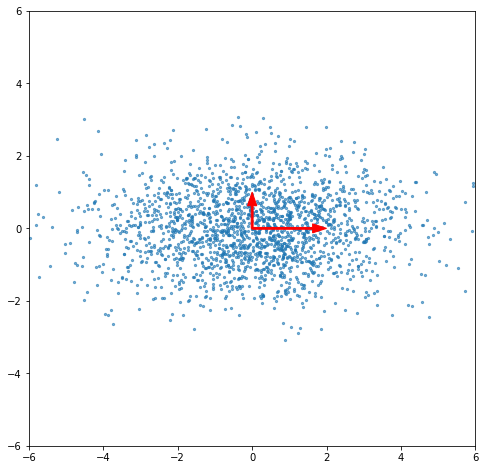

In [3]:
# generate random normally-distributed 2D data

nrows = 2000
xscale, yscale, zscale = 2, 1, 0.5
x = rng.normal(loc=0, scale=xscale, size=nrows, )
y = rng.normal(loc=0, scale=yscale, size=nrows, )
z = rng.normal(loc=0, scale=zscale, size=nrows, )

# center exactly for PCA 
x = x - np.mean(x)
y = y - np.mean(y)
z = z - np.mean(z)

plt.xlim((-6, 6))
plt.ylim((-6, 6))
plt.arrow(0, 0, xscale, 0, width=0.05, head_width=0.25, color='red', length_includes_head=True)
plt.arrow(0, 0, 0, yscale, width=0.05, head_width=0.25, color='red', length_includes_head=True);
plt.scatter(x, y, s=5, alpha=0.6);

In [4]:
principal_axes = np.array([[2, 0], [0, 1]])

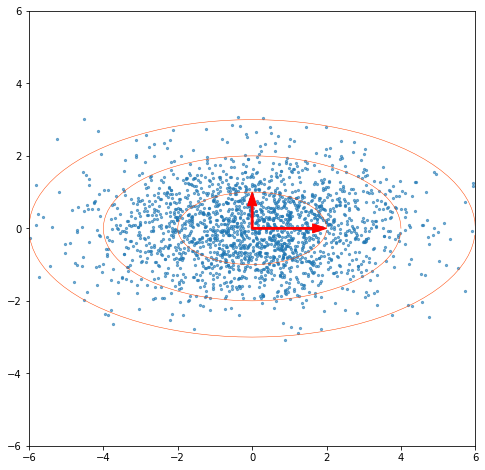

In [5]:
plt.xlim((-6, 6))
plt.ylim((-6, 6))
plt.arrow(0, 0, xscale, 0, width=0.05, head_width=0.25, color='red', length_includes_head=True)
plt.arrow(0, 0, 0, yscale, width=0.05, head_width=0.25, color='red', length_includes_head=True)

# a circle of angles from 0 to 2π
circle = 2 * np.pi * np.arange(0,1,0.01)
# x, y coords
circle = np.array([np.cos(circle), np.sin(circle)])
# 1 std ellipse
circle1 =  circle.T @ principal_axes
plt.plot(circle1[:, 0], circle1[:, 1], lw=0.5, c='orangered')
# 2 std ellipse
circle2 =  2 * circle.T @ principal_axes
plt.plot(circle2[:, 0], circle2[:, 1], lw=0.5, c='orangered')
# 3 std ellipse
circle3 =  3 * circle.T @ principal_axes
plt.plot(circle3[:, 0], circle3[:, 1], lw=0.5, c='orangered')


plt.scatter(x, y, s=5, alpha=0.6);

[[ 0.8660254 -0.5      ]
 [ 0.5        0.8660254]]


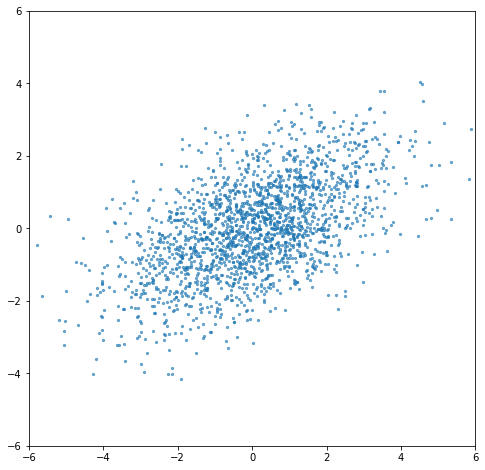

In [6]:
# rotate 2-dimensional data
data2D = np.array([x,y]).T

# rotate
degrees = 30
# convert degrees to radians
theta = np.radians(degrees)
# define a rotation matrix
r = np.array(( (np.cos(theta), -np.sin(theta)),
              (np.sin(theta),  np.cos(theta)) ))
print(r)

# return data with matrix applied
data2D = (r @ data2D.T).T

plt.xlim((-6, 6))
plt.ylim((-6, 6))
plt.scatter(data2D[:,0], data2D[:,1], s=5, alpha=0.6);

In [7]:
# compute singular value decomposition
U, S, Vt = np.linalg.svd(data2D,full_matrices=False)
Sd = np.diag(S)
S

array([89.60494261, 44.55700492])

In [8]:
# recovers our transformation matrix, modulo reversing direction
principal_axes = Sd @ Vt / np.sqrt(nrows)
principal_axes

array([[ 1.73163121,  1.00795646],
       [ 0.501217  , -0.86107193]])

In [9]:
# recovers SD of distribution as norm of principal axes
print(np.linalg.norm(principal_axes[0,:]))
print(np.linalg.norm(principal_axes[1,:]))

2.003627427998028
0.996324918843883


In [10]:
# VT is an orthogonal matrix, dot product is 0
print (principal_axes[0] @ principal_axes[1])
# orthogonal matrix conserves norms, dot products (angles), so SD of noise is simply
print(S / np.sqrt(nrows))

1.1102230246251565e-16
[2.00362743 0.99632492]


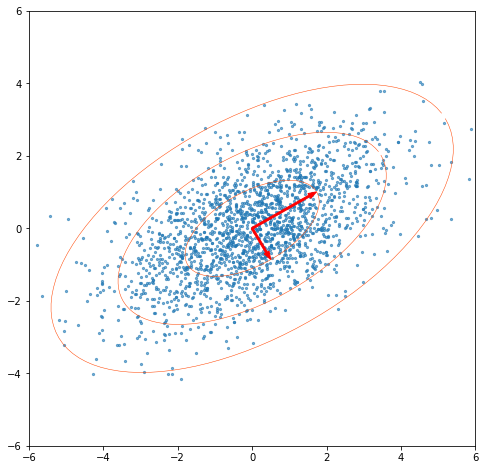

In [11]:
plt.scatter(data2D[:,0], data2D[:,1], s=5, alpha=0.6)
plt.xlim((-6, 6))
plt.ylim((-6, 6))

# a circle of angles from 0 to 2π
circle = 2 * np.pi * np.arange(0,1,0.01)
# x, y coords
circle = np.array([np.cos(circle), np.sin(circle)])
# 1 std ellipse
circle1 =  circle.T @ principal_axes
plt.plot(circle1[:, 0], circle1[:, 1], lw=0.5, c='orangered')
# 2 std ellipse
circle2 =  2 * circle.T @ principal_axes
plt.plot(circle2[:, 0], circle2[:, 1], lw=0.5, c='orangered')
# 3 std ellipse
circle3 =  3 * circle.T @ principal_axes
plt.plot(circle3[:, 0], circle3[:, 1], lw=0.5, c='orangered')

plt.arrow(0, 0, principal_axes[0,0], principal_axes[0,1], width=0.05, color='red', length_includes_head=True)
plt.arrow(0, 0, principal_axes[1,0], principal_axes[1,1], width=0.05, color='red', length_includes_head=True);

## Apply PCA to 3-dimensional data


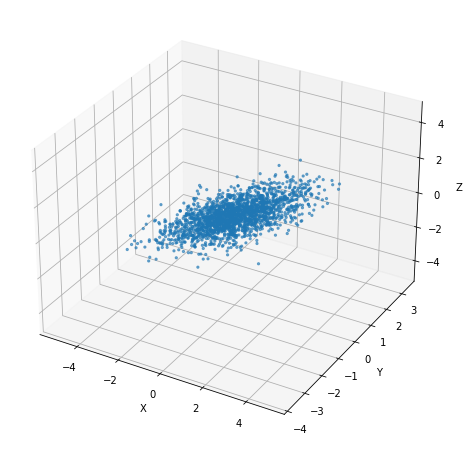

In [12]:
# 3-dimensional data
data3D = np.array([x,y,z]).T

# Rotation about x axis
Rx = np.array([[1, 0, 0],
               [0, np.cos(theta), -np.sin(theta)],
               [0, np.sin(theta), np.cos(theta)]])

# Rotation about y axis
Ry = np.array([[np.cos(theta), 0, np.sin(theta)],
               [0, 1, 0],
               [-np.sin(theta), 0, np.cos(theta)]])

# Rotation about z axis
Rz = np.array([[np.cos(theta), -np.sin(theta), 0],
               [np.sin(theta), np.cos(theta), 0],
               [0, 0, 1]])

# Rotate
data3D = data3D @ Rz @ Ry @ Rx 


fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.scatter(data3D[:,0], data3D[:,1], data3D[:,2], s=5, alpha=0.6);


In [13]:
# compute singular value decomposition
U, S, Vt = np.linalg.svd(data3D,full_matrices=False)
Sd = np.diag(S)
S


array([89.60503135, 44.57220447, 22.53642724])

In [14]:
Vt

array([[ 0.75225147, -0.21404315,  0.62313984],
       [ 0.41506262,  0.88845488, -0.19588506],
       [ 0.51170377, -0.40599687, -0.7571828 ]])

In [15]:
# original rotation
Rz @ Ry @ Rx

array([[ 0.75      , -0.21650635,  0.625     ],
       [ 0.4330127 ,  0.875     , -0.21650635],
       [-0.5       ,  0.4330127 ,  0.75      ]])

In [16]:
principal_axes = Sd @ Vt / np.sqrt(nrows)
principal_axes


array([[ 1.50723317, -0.42886316,  1.2485413 ],
       [ 0.4136783 ,  0.88549169, -0.19523174],
       [ 0.25786279, -0.20459394, -0.381567  ]])

In [17]:
# recover norms
print(np.linalg.norm(principal_axes[0,:]))
print(np.linalg.norm(principal_axes[1,:]))
print(np.linalg.norm(principal_axes[2,:]))

print(S / np.sqrt(nrows))


2.003629412249999
0.9966647910995349
0.5039298328446391
[2.00362941 0.99666479 0.50392983]


In [18]:
# recover original data
data = U @ Sd @ Vt
data

array([[-1.99250806,  0.02004663, -0.75235259],
       [ 1.32488445,  0.07252231,  1.01434747],
       [ 1.03980152,  0.25636025,  2.02849358],
       ...,
       [-1.04870481, -0.33602099, -0.37894264],
       [ 3.20382843, -2.39623215,  2.5882576 ],
       [-0.54495868,  0.42453649, -0.46758645]])

In [19]:
data3D


array([[-1.99250806,  0.02004663, -0.75235259],
       [ 1.32488445,  0.07252231,  1.01434747],
       [ 1.03980152,  0.25636025,  2.02849358],
       ...,
       [-1.04870481, -0.33602099, -0.37894264],
       [ 3.20382843, -2.39623215,  2.5882576 ],
       [-0.54495868,  0.42453649, -0.46758645]])

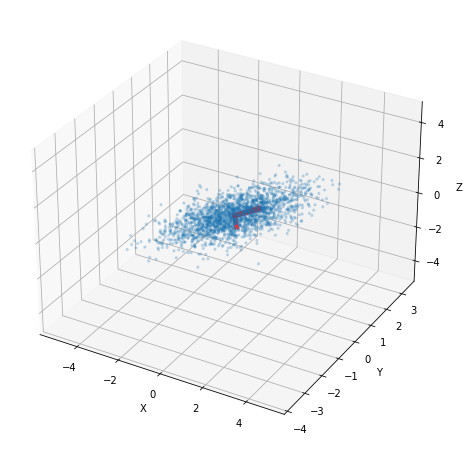

In [20]:
# plot with arrows

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.plot([0, principal_axes[0, 0]], 
        [0, principal_axes[0, 1]], 
        [0, principal_axes[0, 2]], 
        color='red', alpha=0.8, lw=5)
ax.plot([0, principal_axes[1, 0]], 
        [0, principal_axes[1, 1]], 
        [0, principal_axes[1, 2]], 
        color='red', alpha=0.8, lw=5)
ax.plot([0, principal_axes[2, 0]], 
        [0, principal_axes[2, 1]], 
        [0, principal_axes[2, 2]], 
        color='red', alpha=0.8, lw=5)


ax.scatter(data3D[:,0], data3D[:,1], data3D[:,2], s=5, alpha=0.2);

In [21]:
# 3d matplotlib chart is not super readable
# use plotly for interactive chart with ability to drag to rotate, zoom and view data from different perspectives
# zoom in a little, grab and rotate so each principal axis is viewed head on

maxval = int(np.max(data3D))+1

data = go.Scatter3d(x=data3D[:, 0], 
                    y=data3D[:, 1], 
                    z=data3D[:, 2],
                    name="Data",
                    mode='markers',
                    marker=dict(
                        size=2,
                        color=np.linalg.norm(data3D, axis=1),
                        opacity=0.5))

pc1 = go.Scatter3d(x = [0,principal_axes[0, 0]],
                   y = [0,principal_axes[0, 1]],
                   z = [0,principal_axes[0, 2]],
                   marker = dict(size = 1,
                                 color = "rgb(255,0,0)"),
                   line = dict(color = "rgb(255,0,0)",
                               width = 5),
                   name = "PC1"
                  )

pc2 = go.Scatter3d(x = [0,principal_axes[1, 0]],
                   y = [0,principal_axes[1, 1]],
                   z = [0,principal_axes[1, 2]],
                   marker = dict(size = 1,
                                 color = "rgb(255,0,0)"),
                   line = dict(color = "rgb(255,0,0)",
                               width = 5),
                   name = "PC2"
                  )

pc3 = go.Scatter3d(x = [0,principal_axes[2, 0]],
                   y = [0,principal_axes[2, 1]],
                   z = [0,principal_axes[2, 2]],
                   marker = dict(size = 1,
                                 color = "rgb(255,0,0)"),
                   line = dict(color = "rgb(255,0,0)",
                               width = 5),
                   name = "PC3"
                  )

fig = go.Figure(data=[data, pc1, pc2, pc3],
               )
fig.update_layout(
    scene_aspectmode='cube',       
    scene = dict(
        xaxis = dict(nticks=maxval*2+1, range=[-maxval,maxval],),
                     yaxis = dict(nticks=maxval*2+1, range=[-maxval,maxval],),
                     zaxis = dict(nticks=maxval*2+1, range=[-maxval,maxval],),),
    margin=dict(r=20, l=10, b=10, t=10))

fig.show()

In [22]:
U @ np.diag(S) @ Vt

array([[-1.99250806,  0.02004663, -0.75235259],
       [ 1.32488445,  0.07252231,  1.01434747],
       [ 1.03980152,  0.25636025,  2.02849358],
       ...,
       [-1.04870481, -0.33602099, -0.37894264],
       [ 3.20382843, -2.39623215,  2.5882576 ],
       [-0.54495868,  0.42453649, -0.46758645]])

In [23]:
Vt.T @ np.diag(S) @ U.T

array([[-1.99250806,  1.32488445,  1.03980152, ..., -1.04870481,
         3.20382843, -0.54495868],
       [ 0.02004663,  0.07252231,  0.25636025, ..., -0.33602099,
        -2.39623215,  0.42453649],
       [-0.75235259,  1.01434747,  2.02849358, ..., -0.37894264,
         2.5882576 , -0.46758645]])

## Compute PCA using sklearn PCA package and compare


In [24]:
pca = PCA(n_components=data3D.shape[1])
df_pca = pd.DataFrame(pca.fit_transform(data3D),)


In [25]:
pca.components_


array([[-0.75225147,  0.21404315, -0.62313984],
       [ 0.41506262,  0.88845488, -0.19588506],
       [ 0.51170377, -0.40599687, -0.7571828 ]])

In [26]:
Vt


array([[ 0.75225147, -0.21404315,  0.62313984],
       [ 0.41506262,  0.88845488, -0.19588506],
       [ 0.51170377, -0.40599687, -0.7571828 ]])

In [27]:
pca.singular_values_


array([89.60503135, 44.57220447, 22.53642724])

In [28]:
S


array([89.60503135, 44.57220447, 22.53642724])

In [29]:
U


array([[-0.02200746, -0.0148485 , -0.02032462],
       [ 0.01800349,  0.00932526, -0.00530439],
       [ 0.0222237 ,  0.00587801, -0.0491627 ],
       ...,
       [-0.01063669, -0.0147982 , -0.00502626],
       [ 0.05062024, -0.02930427,  0.02895267],
       [-0.00884087,  0.00544247, -0.00431166]])

In [30]:
df_pca.values @ np.diag(1/pca.singular_values_)


array([[ 0.02200746, -0.0148485 , -0.02032462],
       [-0.01800349,  0.00932526, -0.00530439],
       [-0.0222237 ,  0.00587801, -0.0491627 ],
       ...,
       [ 0.01063669, -0.0147982 , -0.00502626],
       [-0.05062024, -0.02930427,  0.02895267],
       [ 0.00884087,  0.00544247, -0.00431166]])

In [31]:
# these are all close to 0
# fitted principal components are df_pca, modulo change of sign
1 - np.abs(np.divide(U, df_pca.values @ np.diag(1/pca.singular_values_)))


array([[ 0.00000000e+00, -2.22044605e-16, -4.44089210e-16],
       [ 0.00000000e+00, -2.22044605e-16, -8.88178420e-16],
       [ 1.11022302e-16, -1.99840144e-15,  1.11022302e-16],
       ...,
       [ 3.33066907e-16,  2.22044605e-16, -4.44089210e-16],
       [ 2.22044605e-16,  5.55111512e-16,  1.11022302e-16],
       [ 0.00000000e+00,  6.66133815e-16,  2.22044605e-16]])

In [32]:
display(pd.DataFrame(U @ Sd))
display(df_pca)

,0,1,2
0,-1.971979,-0.661830,-0.458044
1,1.613204,0.415647,-0.119542
2,1.991355,0.261996,-1.107952
3,-3.797067,-1.385957,-0.744724
4,-2.489172,1.109522,0.197996
...,...,...,...
1995,0.722059,0.995397,-0.075964
1996,-0.074142,-0.237614,-0.807236
1997,-0.953101,-0.659588,-0.113274
1998,4.535828,-1.306156,0.652490


,0,1,2
0,1.971979,-0.661830,-0.458044
1,-1.613204,0.415647,-0.119542
2,-1.991355,0.261996,-1.107952
3,3.797067,-1.385957,-0.744724
4,2.489172,1.109522,0.197996
...,...,...,...
1995,-0.722059,0.995397,-0.075964
1996,0.074142,-0.237614,-0.807236
1997,0.953101,-0.659588,-0.113274
1998,-4.535828,-1.306156,0.652490


In [33]:
display(df_pca.values @ pca.components_)
display(data3D)


array([[-1.99250806,  0.02004663, -0.75235259],
       [ 1.32488445,  0.07252231,  1.01434747],
       [ 1.03980152,  0.25636025,  2.02849358],
       ...,
       [-1.04870481, -0.33602099, -0.37894264],
       [ 3.20382843, -2.39623215,  2.5882576 ],
       [-0.54495868,  0.42453649, -0.46758645]])

array([[-1.99250806,  0.02004663, -0.75235259],
       [ 1.32488445,  0.07252231,  1.01434747],
       [ 1.03980152,  0.25636025,  2.02849358],
       ...,
       [-1.04870481, -0.33602099, -0.37894264],
       [ 3.20382843, -2.39623215,  2.5882576 ],
       [-0.54495868,  0.42453649, -0.46758645]])

## Compute SVD using basic linear algebra

In [34]:
# right singular vectors using basic linear algebra
Cov=(data3D.T @ data3D) / nrows 
print("Covariance shape:", Cov.shape)
# compute eigenvectors from covariance matrix
right_eigenvalues, right_eigenvectors = np.linalg.eig(Cov)
# perform the projection
print("Manual output:")
display(pd.DataFrame(data3D @ right_eigenvectors))

# PCA package output
display(df_pca)


Covariance shape: (3, 3)
Manual output:


,0,1,2
0,1.971979,-0.458044,-0.661830
1,-1.613204,-0.119542,0.415647
2,-1.991355,-1.107952,0.261996
3,3.797067,-0.744724,-1.385957
4,2.489172,0.197996,1.109522
...,...,...,...
1995,-0.722059,-0.075964,0.995397
1996,0.074142,-0.807236,-0.237614
1997,0.953101,-0.113274,-0.659588
1998,-4.535828,0.652490,-1.306156


,0,1,2
0,1.971979,-0.661830,-0.458044
1,-1.613204,0.415647,-0.119542
2,-1.991355,0.261996,-1.107952
3,3.797067,-1.385957,-0.744724
4,2.489172,1.109522,0.197996
...,...,...,...
1995,-0.722059,0.995397,-0.075964
1996,0.074142,-0.237614,-0.807236
1997,0.953101,-0.659588,-0.113274
1998,-4.535828,-1.306156,0.652490


In [35]:
# same modulo sort order
display(S/np.sqrt(nrows))
display(np.sqrt(right_eigenvalues))

array([2.00362941, 0.99666479, 0.50392983])

array([2.00362941, 0.50392983, 0.99666479])

In [36]:
# same modulo sort order and sign
display(right_eigenvectors.T)
display(Vt)

array([[-0.75225147,  0.21404315, -0.62313984],
       [ 0.51170377, -0.40599687, -0.7571828 ],
       [ 0.41506262,  0.88845488, -0.19588506]])

array([[ 0.75225147, -0.21404315,  0.62313984],
       [ 0.41506262,  0.88845488, -0.19588506],
       [ 0.51170377, -0.40599687, -0.7571828 ]])

In [37]:
# permutation matrix
mat_size = len(right_eigenvalues)
S_sort_indexes = np.flip(np.argsort(right_eigenvalues))
print(S_sort_indexes)
perm_mat = np.zeros((mat_size, mat_size))
for i in range(mat_size):
    perm_mat[i, S_sort_indexes[i]] = 1
print(perm_mat)

[0 2 1]
[[1. 0. 0.]
 [0. 0. 1.]
 [0. 1. 0.]]


In [38]:
right_eigenvalues = perm_mat @ right_eigenvalues
S_diag = np.diag(np.sqrt(right_eigenvalues))*np.sqrt(nrows)
print(S_diag)
print(Sd)

[[89.60503135  0.          0.        ]
 [ 0.         44.57220447  0.        ]
 [ 0.          0.         22.53642724]]
[[89.60503135  0.          0.        ]
 [ 0.         44.57220447  0.        ]
 [ 0.          0.         22.53642724]]


In [39]:
right_eigenvectors =  right_eigenvectors.T 
right_eigenvectors = perm_mat @ right_eigenvectors 
print(right_eigenvectors)
print()
print(Vt)

[[-0.75225147  0.21404315 -0.62313984]
 [ 0.41506262  0.88845488 -0.19588506]
 [ 0.51170377 -0.40599687 -0.7571828 ]]

[[ 0.75225147 -0.21404315  0.62313984]
 [ 0.41506262  0.88845488 -0.19588506]
 [ 0.51170377 -0.40599687 -0.7571828 ]]


In [40]:
# not sure why I have to do this
# when you swap 2 axes, that's a reflection, not a rotation
# so to make it a rotation again you have to do another reflection and reverse the sign on 3rd axis?
# orthonormal vectors with determinant 1 are pure rotation, determinant -1 have a reflection, possibly we have to multiply by determinant of permutation matrix to make sure it's still a rotation
# moral : linear algebra is hard, use the built-in SVD and PCA

print(np.linalg.det(perm_mat))
print(np.linalg.det(Vt))
right_eigenvectors[0,:] = -right_eigenvectors[0,:]
right_eigenvectors

-1.0
-1.0


array([[ 0.75225147, -0.21404315,  0.62313984],
       [ 0.41506262,  0.88845488, -0.19588506],
       [ 0.51170377, -0.40599687, -0.7571828 ]])

In [41]:
# left singular vectors
Cov=(data3D @ data3D.T) / nrows
# compute the eigenvectors from covariance matrix
left_eigenvalues, left_eigenvectors = np.linalg.eig(Cov)

# these are complex, presumably rounding with very small imaginary part? Cov shd be pos def, real eigenvalues/vectors
print ("max imaginary val", max(left_eigenvalues.imag))

# get real part, also use only first 3 cols (skinny economy SVD)
left_eigenvectors = left_eigenvectors.real[:, :3]
left_eigenvalues=left_eigenvalues.real
display(left_eigenvectors)
# show we get same as before
display(U)

max imaginary val 1.3051144752530622e-16


array([[-0.02200746, -0.0148485 , -0.02032462],
       [ 0.01800349,  0.00932526, -0.00530439],
       [ 0.0222237 ,  0.00587801, -0.0491627 ],
       ...,
       [-0.01063669, -0.0147982 , -0.00502626],
       [ 0.05062024, -0.02930427,  0.02895267],
       [-0.00884087,  0.00544247, -0.00431166]])

array([[-0.02200746, -0.0148485 , -0.02032462],
       [ 0.01800349,  0.00932526, -0.00530439],
       [ 0.0222237 ,  0.00587801, -0.0491627 ],
       ...,
       [-0.01063669, -0.0147982 , -0.00502626],
       [ 0.05062024, -0.02930427,  0.02895267],
       [-0.00884087,  0.00544247, -0.00431166]])

In [42]:
print(left_eigenvectors)
print()
print(U)
print("=====")
print(S_diag)
print()
print(Sd)
print("=====")
print(right_eigenvectors)
print()
print(Vt)


[[-0.02200746 -0.0148485  -0.02032462]
 [ 0.01800349  0.00932526 -0.00530439]
 [ 0.0222237   0.00587801 -0.0491627 ]
 ...
 [-0.01063669 -0.0147982  -0.00502626]
 [ 0.05062024 -0.02930427  0.02895267]
 [-0.00884087  0.00544247 -0.00431166]]

[[-0.02200746 -0.0148485  -0.02032462]
 [ 0.01800349  0.00932526 -0.00530439]
 [ 0.0222237   0.00587801 -0.0491627 ]
 ...
 [-0.01063669 -0.0147982  -0.00502626]
 [ 0.05062024 -0.02930427  0.02895267]
 [-0.00884087  0.00544247 -0.00431166]]
=====
[[89.60503135  0.          0.        ]
 [ 0.         44.57220447  0.        ]
 [ 0.          0.         22.53642724]]

[[89.60503135  0.          0.        ]
 [ 0.         44.57220447  0.        ]
 [ 0.          0.         22.53642724]]
=====
[[ 0.75225147 -0.21404315  0.62313984]
 [ 0.41506262  0.88845488 -0.19588506]
 [ 0.51170377 -0.40599687 -0.7571828 ]]

[[ 0.75225147 -0.21404315  0.62313984]
 [ 0.41506262  0.88845488 -0.19588506]
 [ 0.51170377 -0.40599687 -0.7571828 ]]


In [43]:
left_eigenvectors @ S_diag @ right_eigenvectors


array([[-1.99250806,  0.02004663, -0.75235259],
       [ 1.32488445,  0.07252231,  1.01434747],
       [ 1.03980152,  0.25636025,  2.02849358],
       ...,
       [-1.04870481, -0.33602099, -0.37894264],
       [ 3.20382843, -2.39623215,  2.5882576 ],
       [-0.54495868,  0.42453649, -0.46758645]])

In [44]:
data3D


array([[-1.99250806,  0.02004663, -0.75235259],
       [ 1.32488445,  0.07252231,  1.01434747],
       [ 1.03980152,  0.25636025,  2.02849358],
       ...,
       [-1.04870481, -0.33602099, -0.37894264],
       [ 3.20382843, -2.39623215,  2.5882576 ],
       [-0.54495868,  0.42453649, -0.46758645]])

## Apply SVD and optimal threshold to an image of known rank

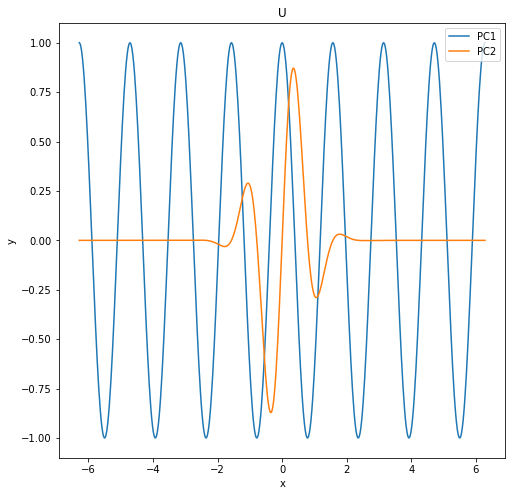

In [45]:
indexes = np.linspace(-2*np.pi, 2*np.pi, 500)
U1 = np.cos(indexes*4)
U2 = np.exp(-indexes**2) * np.sin(indexes*4)
Utrue = np.array((U1,U2)).T

plt.xlabel('x')
plt.ylabel('y')
plt.title('U')
plt.plot(indexes, Utrue)
plt.legend(('PC1', 'PC2'));

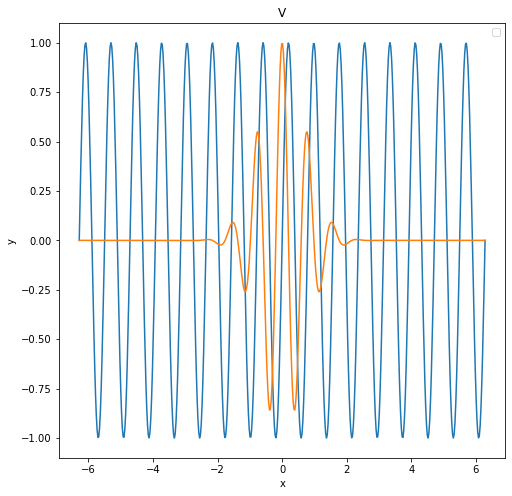

In [46]:
V1 = np.sin(indexes*8)
V2 = np.exp(-indexes**2) * np.cos(indexes*8)
Vtrue = np.array((V1,V2)).T

plt.xlabel('x')
plt.ylabel('y')

plt.title('V')
plt.legend(('PC1', 'PC2'));

plt.plot(indexes, Vtrue);

In [47]:
Strue = np.array([[1, 0],[0, 1]])
Xtrue = Utrue @ Strue @ Vtrue.T
Xtrue.shape

(500, 500)

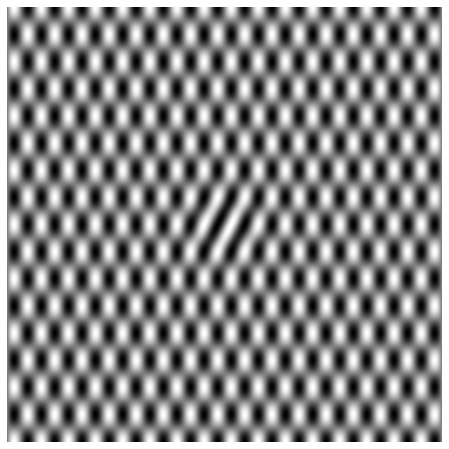

In [48]:
plt.imshow(Xtrue)
plt.set_cmap('gray')
plt.axis('off')
plt.show()

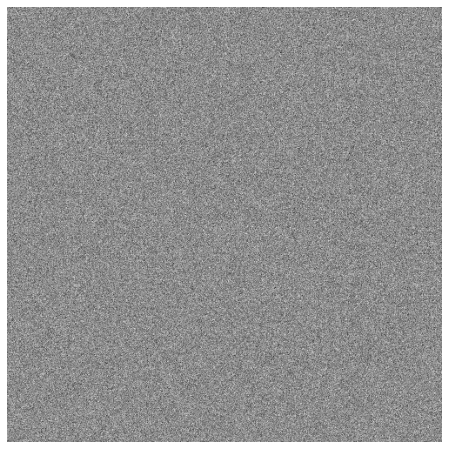

In [49]:
# add noise
sigma = 1
Xnoise = sigma*np.random.randn(*Xtrue.shape)
plt.imshow(Xnoise)
plt.set_cmap('gray')
plt.axis('off')
plt.show()

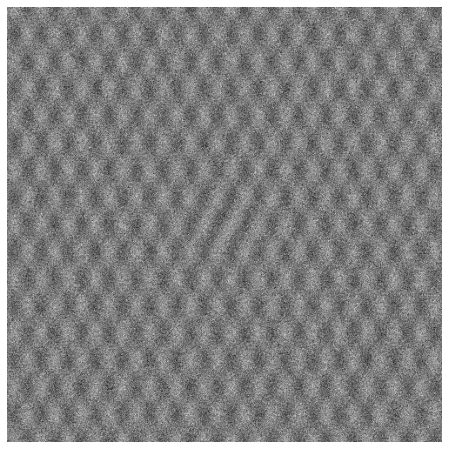

In [50]:
Xnoisy = (Xtrue + Xnoise)/2
plt.imshow(Xnoisy)
plt.set_cmap('gray')
plt.axis('off')
plt.show()

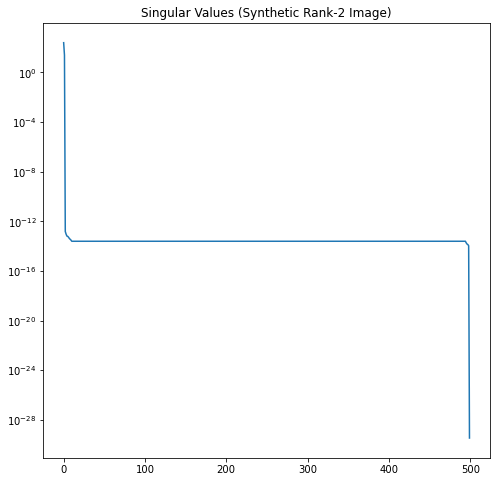

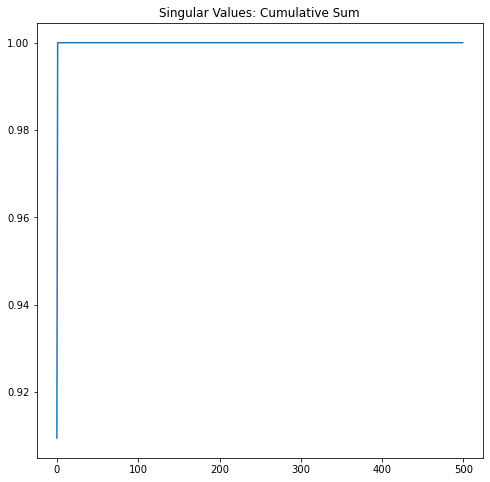

In [51]:
U, S, Vt = np.linalg.svd(Xtrue,full_matrices=0)

plt.figure(1)
plt.semilogy(S)
plt.title('Singular Values (Synthetic Rank-2 Image)')
plt.show()

plt.figure(2)
plt.plot(np.cumsum(S)/np.sum(S))
plt.title('Singular Values: Cumulative Sum')
plt.show()

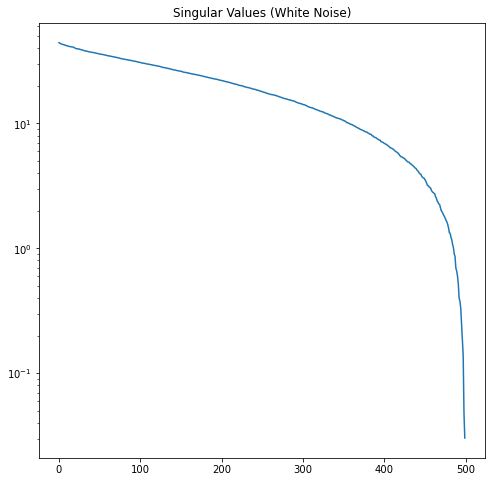

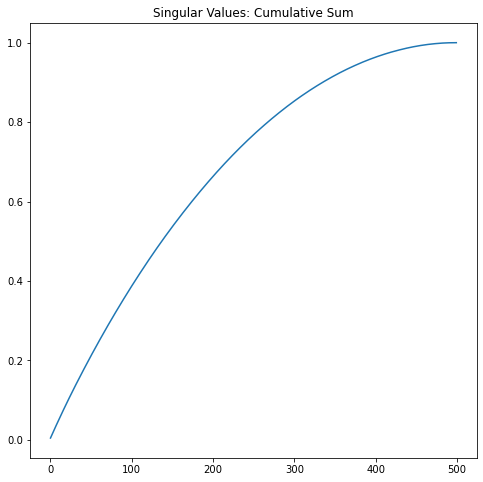

In [52]:
U, S, Vt = np.linalg.svd(Xnoise,full_matrices=0)

plt.figure(1)
plt.semilogy(S)
plt.title('Singular Values (White Noise)')
plt.show()

plt.figure(2)
plt.plot(np.cumsum(S)/np.sum(S))
plt.title('Singular Values: Cumulative Sum')
plt.show()

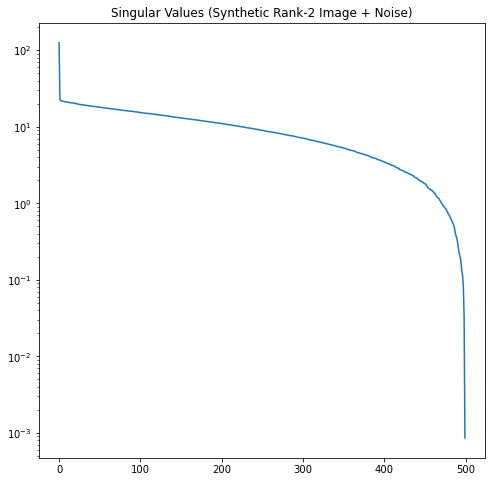

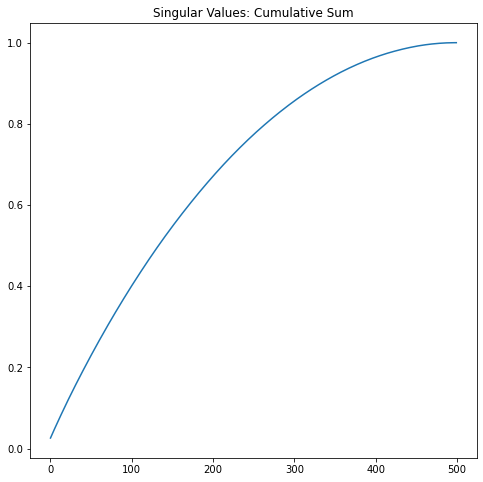

In [53]:
U, S, Vt = np.linalg.svd(Xnoisy,full_matrices=0)

plt.figure(1)
plt.semilogy(S)
plt.title('Singular Values (Synthetic Rank-2 Image + Noise)')
plt.show()

plt.figure(2)
plt.plot(np.cumsum(S)/np.sum(S))
plt.title('Singular Values: Cumulative Sum')
plt.show()

In [54]:
S

array([1.25786614e+02, 2.25820852e+01, 2.20352401e+01, 2.18671500e+01,
       2.16957031e+01, 2.14847656e+01, 2.13912084e+01, 2.12524885e+01,
       2.12360494e+01, 2.11260454e+01, 2.09909475e+01, 2.09434463e+01,
       2.08222763e+01, 2.07475869e+01, 2.06961488e+01, 2.05692062e+01,
       2.05127489e+01, 2.04810830e+01, 2.03882812e+01, 2.03473966e+01,
       2.02326662e+01, 2.00994427e+01, 1.99629325e+01, 1.98058899e+01,
       1.97308258e+01, 1.96618265e+01, 1.96244250e+01, 1.95419607e+01,
       1.94678670e+01, 1.93872074e+01, 1.93078328e+01, 1.91936989e+01,
       1.91540527e+01, 1.90514596e+01, 1.89891149e+01, 1.89550307e+01,
       1.88605433e+01, 1.88241448e+01, 1.87663233e+01, 1.86678909e+01,
       1.86003737e+01, 1.85576864e+01, 1.85067091e+01, 1.84509841e+01,
       1.84189634e+01, 1.83719888e+01, 1.83280983e+01, 1.82514490e+01,
       1.81288456e+01, 1.80728102e+01, 1.80284248e+01, 1.79689343e+01,
       1.79159614e+01, 1.78527704e+01, 1.77991361e+01, 1.77544112e+01,
      

cutoff value 51.639777949432236
cutof rank 1


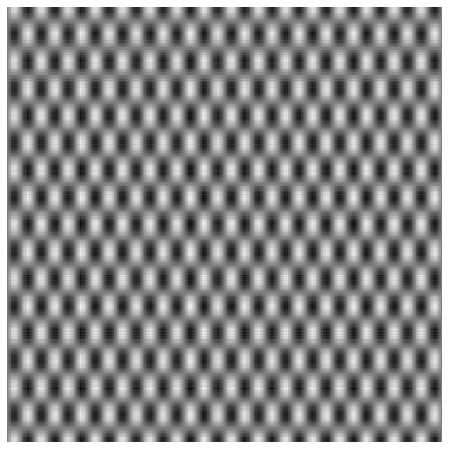

In [55]:
# use formula for threshold using known sigma
N = Xnoisy.shape[0]
cutoff = (4/np.sqrt(3)) * np.sqrt(N) * sigma # threshold
print("cutoff value", cutoff)
r = np.max(np.where(S > cutoff)) 
# Keep modes w/ sig > cutoff + 1
print("cutof rank", r+1)

Xclean = U[:,:(r+1)] @ np.diag(S[:(r+1)]) @ Vt[:(r+1),:]
plt.imshow(Xclean)
plt.set_cmap('gray')
plt.axis('off')
plt.show()
# gives our original matrix wih minimal noise

rank to capture 90% of variance 334


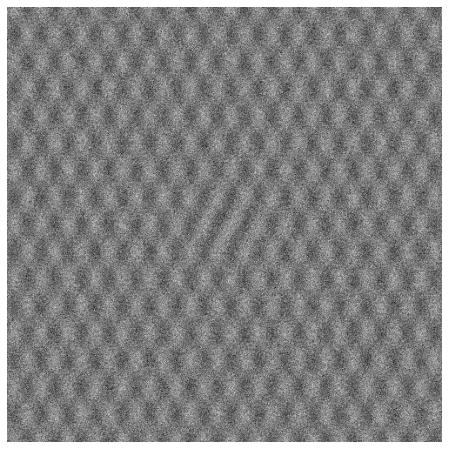

In [56]:
# use 90% threshold, get a lot of noise
rank_90pct = 1 + np.where(np.cumsum(S)/sum(S)>0.90)[0][0]
print("rank to capture 90% of variance", rank_90pct)
Xclean = U[:,:rank_90pct] @ np.diag(S[:rank_90pct]) @ Vt[:rank_90pct,:]
plt.imshow(Xclean)
plt.set_cmap('gray')
plt.axis('off')
plt.show()

In [57]:
# from http://www.pyrunner.com/weblog/2016/08/01/optimal-svht/
# see also https://github.com/erichson/optht/blob/master/optht/optht.py

def omega_approx(beta):
    """Return an approximate omega value for given beta. Equation (5) from Gavish 2014."""
    return 0.56 * beta**3 - 0.95 * beta**2 + 1.82 * beta + 1.43

def lambda_star(beta):
    """Return lambda star for given beta. Equation (11) from Gavish 2014."""
    return np.sqrt(2 * (beta + 1) + (8 * beta) / 
                   (beta + 1 + np.sqrt(beta**2 + 14 * beta + 1)))

def svht(X, sigma=None, sv=None):
    """Return the optimal singular value hard threshold (SVHT) value.
    `X` is any m-by-n matrix. `sigma` is the standard deviation of the 
    noise, if known. Optionally supply the vector of singular values `sv`
    for the matrix (only necessary when `sigma` is unknown). If `sigma`
    is unknown and `sv` is not supplied, then the method automatically
    computes the singular values."""

    try:
        m,n = sorted(X.shape) # ensures m <= n
    except:
        raise ValueError('invalid input matrix')
    beta = m / n # ratio between 0 and 1
    if sigma is None: # sigma unknown
        if sv is None:
            sv = svdvals(X)
        sv = np.squeeze(sv)
        if sv.ndim != 1:
            raise ValueError('vector of singular values must be 1-dimensional')
        return np.median(sv) * omega_approx(beta)
    else: # sigma known
        return lambda_star(beta) * np.sqrt(n) * sigma

# find tau star when sigma is known
tau = svht(Xnoisy, sigma=sigma)
print("tau with known sigma", tau)

# find tau star hat when sigma is unknown
tau = svht(Xnoisy, sv=S)
print("tau based on singular values", tau)



tau with known sigma 51.63977794943222
tau based on singular values 25.784559408619963


## Apply SVD and optimal threshold to a photograph

In [72]:
img = plt.imread('lena.png')
# img = plt.imread('mandrill.png')


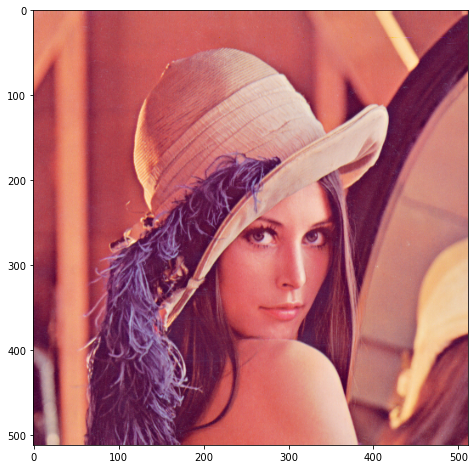

In [73]:
plt.imshow(img);

In [60]:
img.shape

(512, 512, 3)

In [61]:
# flatten color to a 2D matrix 
img_flat=img.reshape(512, 512*3)
img_flat.shape

(512, 1536)

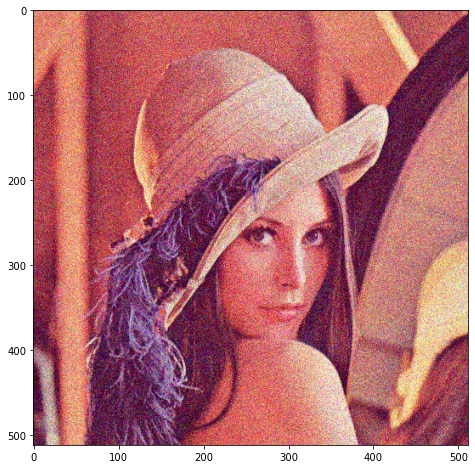

In [62]:
# add noise
sigma = 0.125
img_noise = img_flat + np.random.normal(loc=0, scale=sigma, size=(512, 1536))
img_noise = np.clip(img_noise, 0, 1)

plt.imshow(img_noise.reshape(512,512,3));

In [63]:
# perform SVD
U, S, VT = np.linalg.svd(img_noise,full_matrices=False)
Sd = np.diag(S)


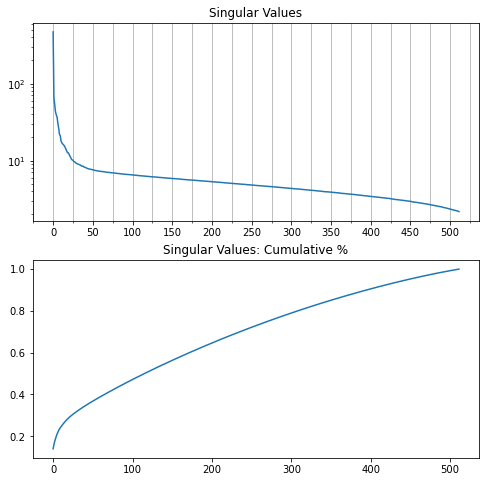

In [69]:
import matplotlib.ticker as ticker

fig, axs = plt.subplots(nrows=2, ncols=1)
axs[0].semilogy(np.diag(Sd))
axs[0].xaxis.set_major_locator(ticker.MultipleLocator(50))
axs[0].xaxis.set_minor_locator(ticker.MultipleLocator(25))
axs[0].grid(which='both', axis='x')
axs[0].set_title('Singular Values')

axs[1].plot(np.cumsum(np.diag(Sd))/np.sum(np.diag(Sd)))
axs[1].set_title('Singular Values: Cumulative %');


In [65]:
tau = svht(img_noise, sv=S)
print("tau based on singular values", tau)


tau based on singular values 9.261761924834289


In [66]:
r = np.max(np.where(S > tau))+1 # Keep modes w/ sig > cutoff 
r

29

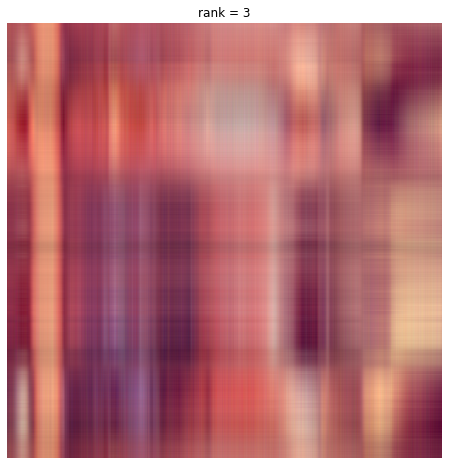

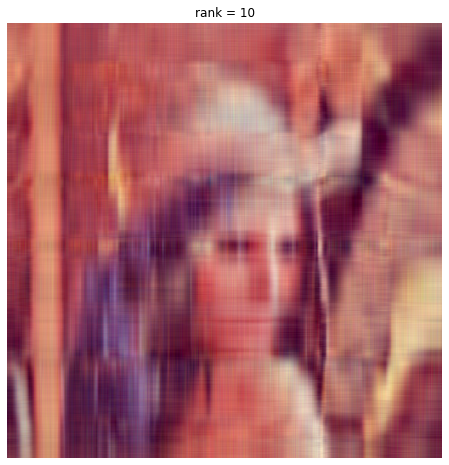

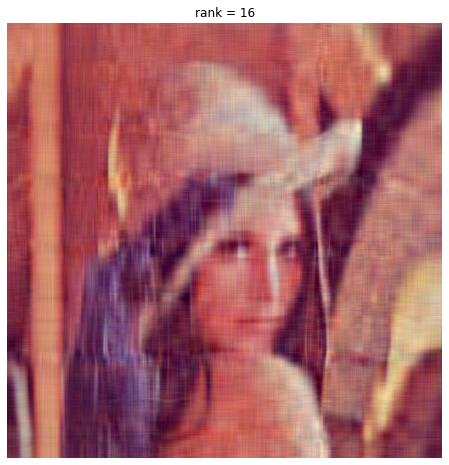

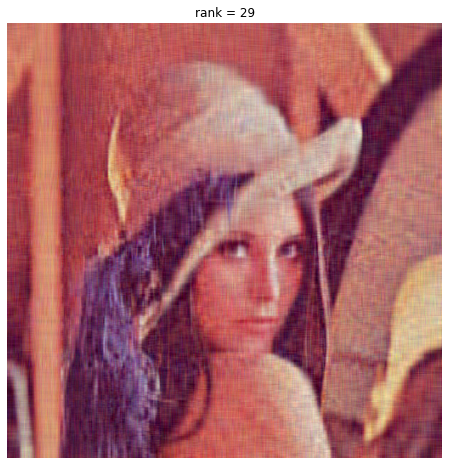

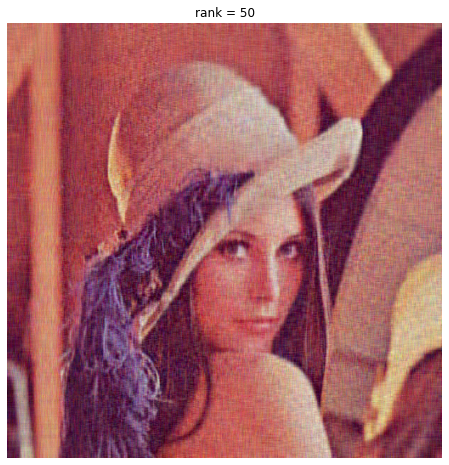

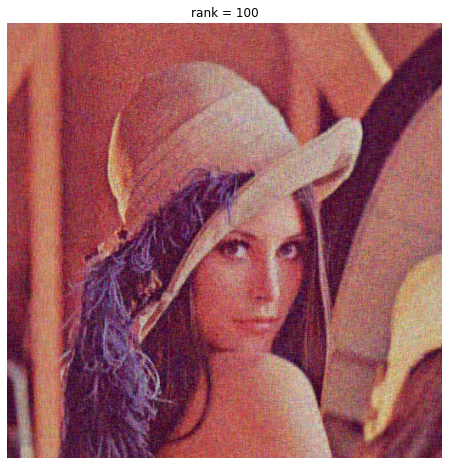

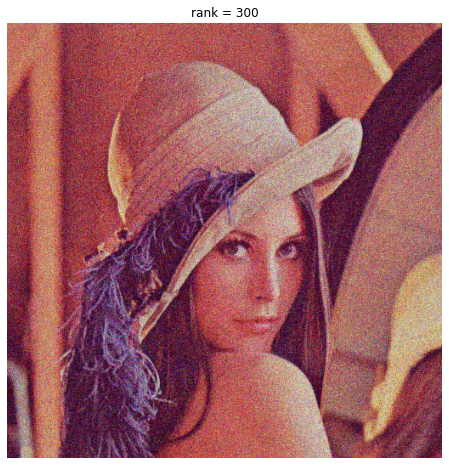

In [67]:
j = 0
for r in (3, 10, 16, 29, 50, 100, 300):
    # Construct approximate image
    Xapprox = U[:,:r] @ Sd[0:r,:r] @ VT[:r,:]
    Xapprox = Xapprox.reshape([512,512,3])
    Xapprox = Xapprox/np.max(Xapprox)
    Xapprox = np.clip(Xapprox, 0, 1)
    plt.figure(j+1)
    j += 1
    img = plt.imshow(Xapprox)
    plt.axis('off')
    plt.title('rank = ' + str(r))
    plt.show()
    

In [68]:
# the rank 29 compression is acceptable. didn't perform any noise reduction. and adding more dimensions does improve the image.
# It's not obvious that adding more ranks adds more noise than data
# maybe the brain is really good at filtering the noise.
# It seems to me that using this threshold as a starting point and adding some additional ranks for safety 
# is likely to capture what is needed for image processing, even tripling adds a modest improvement.
